<a href="https://colab.research.google.com/github/Rinniedh/Python_practice/blob/main/Fun_Image_Detection_Lab_Assignment_04_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab Assignment 04 - Computer Vision Using Cognitive Services and Python!

In this lab assignment, we will be using **Microsoft Azure Cognitive Services** to perform a wide variety of computer vision tasks on a collection of images.

By the time you have completed this lab, you will have achieved all of the following learning objectives:

## Learning Objectives

* Have the ability to configure and provision the *Computer Vision* cognitive service as a resource on the Microsoft Azure platform.
* Use Python to connect to and interact with the cognitive service noted above via its API.
* Have the ability to iteratively send images to the Computer Vision cognitive service and process the results, including:
  * Automatically generating sentences that describe images;
  * Detecting product brands and corporate logos in images;
  * Determining whether images are clipart or line drawings;
  * Identifying celebrities in images;
  * Identifying landmarks in images; and
  * Determining the age and gender of people appearing in images.
* Continue to develop skills working with and analyzing data in Python.

## About the Computer Vision Cognitive Service

According to Microsoft:

> "Azure's Computer Vision service provides developers with access to advanced algorithms that process images and return information, depending on the visual features you're interested in."

The Computer Vision service contains tools that can identify and tag visual features in an image, detect objects in images, detect brands and logos in images, categorize images, generate sentences that describe images, detect faces in images, detect whether images are clipart or line drawings, identify celebrities, read handwritten text that appears in images in dozens of languages, etc.

You may learn more about the Computer Vision service [on this website](https://docs.microsoft.com/en-us/azure/cognitive-services/computer-vision/home).

## API Key and Endpoint

To complete this lab, you will will be using an API key and endpoint URL that I have already configured for you. Although you can certainly configure your own Computer Vision service on the Azure AI platform, Microsoft follows strict "responsible AI" guidelines with respect to its computer vision API, which means that certain features (such as detecting celebrities and guessing people's ages and genders) are restricted only to developers who have applied to use them and have received approval. Fortunately, I have handled these arduous steps for us by obtaining an approved account!

Be sure to run the code cell below before continuing with the lab assignment.

In [31]:
#Please use the following Computer Vision API key and endpoint for this lab assignment
api_key = '718564642a784520a625a6b7f9d2884f'
endpoint_url = 'https://computer-vision-master.cognitiveservices.azure.com/'

## Install Azure Computer Vision and Import Libraries

The Azure Computer Vision service is not installed by default in most Jupyter Notebook environments, so we'll need to install it. As usual, we'll also need to import all of the libraries that we'll use in the lab assignment.

Run the code cell below to install the computer vision service and import all of the necessary libraries.

In [32]:
#install Microsoft Azure Computer Vision Cognitive Service library
!pip install --upgrade azure-cognitiveservices-vision-computervision

#import libraries
import json
import matplotlib.pyplot as plt
import os
import pandas as pd
import requests
import time
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from IPython.display import clear_output
from msrest.authentication import CognitiveServicesCredentials
from PIL import Image

#allow images to be displayed inline in the notebook
%matplotlib inline

## Load Image Data

The data for this lab assignment are images (in *JPG* format) of a wide variety of different things. There are two parts to the data:

1. The images themselves (i.e., the *JPG* files), and
2. A CSV file that contains information about the *JPG* files.

Before continuing, be sure to upload all of the files that you will need for this assignment. In total, there are **32** data files, consisting of 1 CSV file and 31 JPG files.

***Important***: Please create a folder in your Google Colab environment named `images` and upload all of the JPG files to that folder.

**TIP**: Google Colab supports multiple simultaneous file uploads, so rather than uploading each data file individually, simply select all of the files, and upload them at the same time.

### Dataset Variables

The CSV file for this lab assignment contains just one variable:
* <u>filename</u>: The location of each JPG file (e.g., `images/test.jpg`)

Run the code cell below to load the CSV file into a pandas dataframe, and preview the first few rows of data. The code cell also determines how many images appear in the dataset, and stores the result in a variable named `total_images`.

In [33]:
#load data into dataframe
df = pd.read_csv('Lab Assignment 04 - Data.csv')
print(df.head(10))

#determine the total number of images (rows) in the dataset
total_images = df.shape[0]

          filename
0  images/BAIX.jpg
1  images/BSNT.jpg
2  images/DBQO.jpg
3  images/GJQW.jpg
4  images/GMOS.jpg
5  images/HDAE.jpg
6  images/HLUF.jpg
7  images/IGSU.jpg
8  images/IIJE.jpg
9  images/IXZT.jpg


## Connect to the Azure Computer Vision Cognitive Service

As noted at the beginning of the lab, you will need your API key and endpoint URL in order to connect to the Computer Vision API, so please be sure that you configured the Computer Vision resource in your Azure account, and that you added your key and endpoint values to the appropriate variables.

When you're certain that you've stored your key and endpoint values in the `api_key` and `endpoint_url` variables, run the code cell below to authenticate yourself with the Azure Computer Vision service, and create a new instance of a `ComputerVisionClient` object. Your `ComputerVisionClient` object will be needed to use all of the functions available through the Computer Vision service.


In [35]:
#authenticate with the Azure computer vision cognitive service, and get a ComputerVisionClient object
client = ComputerVisionClient(endpoint_url, CognitiveServicesCredentials(api_key))

## The `display_image()` Function
Since we'll be working with images in this lab, it will be useful to have a simple function that we can call to display an image in the notebook. This is the purpose of the `display_image()` function in the cell below. This function takes two parameters:
1. The name of the image file that we want to display in the notebook; and
2. The caption (if any) that we want to display for the image (default = `None`).

Run the code cell below to make the `display_image()` function available to your Python program.

In [36]:
#define a function that will display an image in the notebook, with an optional caption
def display_image(image_filename, image_caption=None):
  image = Image.open(image_filename)
  plt.imshow(image)
  plt.axis('off')
  if image_caption != None: #if we need to display a caption for this image
    plt.title(image_caption, size='x-large', y=-0.1)
  plt.show()

## The `analyze_image()` Function
Now that you've successfully authenticated yourself to the Computer Vision cognitive service, let's learn a bit more about the Computer Vision API. One of the interesting things about this API is that it's designed in such a way that we can route requests for almost all of its services through just a few functions. Basically, we just need to send the API an image and tell it what type of analysis we would like it to perform, and it will return the results. The `analyze_image()` function below implements this model. The function takes three parameters:
1. The name of the image file that we want to analyze;
2. A string containing the name of the type of features that we want the API to detect or generate; and
3. Whether or not we want to analyze the image for domain-specific content such as celebrities or landmarks (default = `False`).

The only component of this model that is a bit tricky are the results themselves -- depending on what kind of analysis is requested, the API will return different types of results objects. We must therefore be aware of how each different result object is structured if we want to access its data.

To send an image to the API, we will need to open the image for reading in binary format (since we'll need to send all of the image's bytes to the API over the Internet).

#### Task for Question 01:
Write a line of code in the cell below that will open the `image_filename` file for reading in binary format, and then run the cell to make the `analyze_image()` function available to your project. See [this article](https://www.tutorialsteacher.com/python/python-read-write-file) to learn how to open files for binary reading.

In [37]:
import time
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from msrest.authentication import CognitiveServicesCredentials

subscription_key = '718564642a784520a625a6b7f9d2884f'
endpoint = 'https://computer-vision-master.cognitiveservices.azure.com/'
client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(api_key))

def analyze_image(image_filename, feature_name, analyze_by_domain=False):
    # Open the image file for reading in binary format
    image = open(image_filename, 'rb')

    # Send the image to the Computer Vision API, and ask the API to analyze the image for the specified feature
    if analyze_by_domain:  # if we want to analyze the image for domain-specific content
        results = client.analyze_image_by_domain_in_stream(feature_name, image)
    else:  # if we just want to conduct a "normal" analysis
        results = client.analyze_image_in_stream(image, visual_features=[feature_name])

    # Close the image file
    image.close()

    # Sleep for 3.1 seconds to ensure that we do not exceed the 20 images per minute limit
    time.sleep(3.1)

    # Return the results generated by the call to the Computer Vision API
    return results


## Test the Computer Vision API
Now that you are familiar with the `analyze_image()` function, let's test the API to verify that everything is working properly. To test the API, we'll send a test image to the API's *image description* service. This service evaluates the image and automatically generates a sentence that describes the image.

Run the code cell below to send the test image to the API and request a description of the image.

#### Question 01:
Which objects were mentioned in the API's automatically generated description of the test image?

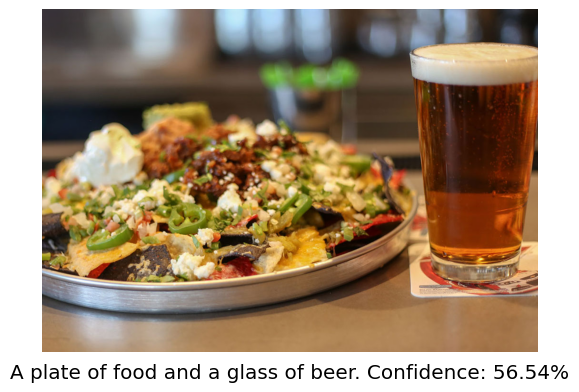

In [38]:
#define the test image
image_filename = '/bin/images/test.jpg'

#send the test image to the API and request a description of the image
results = analyze_image(image_filename, 'description')

#if at least one image description was generated by the API
if len(results.description.captions) > 0:
  #get the caption for which the API has the greatest confidence
  caption = results.description.captions[0]
  #display the image and its caption
  display_image(image_filename, image_caption='{}. Confidence: {:.2f}%'.format(caption.text.capitalize(), caption.confidence * 100))
else: #if the API did not generate a description for this image
  print('No description was generated for "{}"'.format(image_filename))

## Product Placement
According to the *Oxford English Dictionary*, **Product Placement** is:
> "A practice in which manufacturers of goods or providers of a service gain exposure for their products by paying for them to be featured in movies and television programs."

Put differently, companies often pay a lot of money to have their products appear on screen. One of the interesting features of the Computer Vision API is that it has the ability to identify product brands and corporate logos in images. Let's test this capability, and see if the API can identify some of these "product placements".

#### Task for Questions 02 and 03:
Modify the code in the cell below so that it will:
1. Loop through all of the images (filenames) in the dataframe, and send each image to the Computer Vision API;
2. Keep track of the number of images that contain at least one product brand or corporate logo; and
3. Print the number of images that contain at least one product brand or corporate logo.

When you have finished modifying the code, run the cell to analyze the images for product placements.

#### Question 02:
How many of the images in the dataset did the API identify as containing at least one product brand or corporate logo?

#### Question 03:
Which product brand or corporate logo appeared most frequently among the images in the dataset?

Processing images (this should take about 90 seconds)...


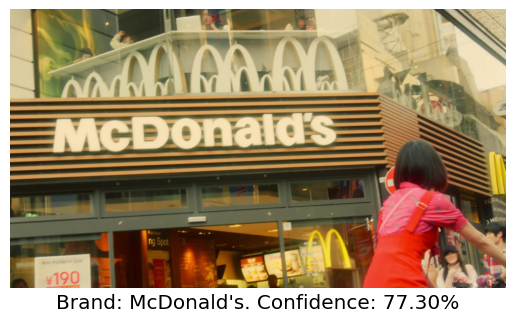

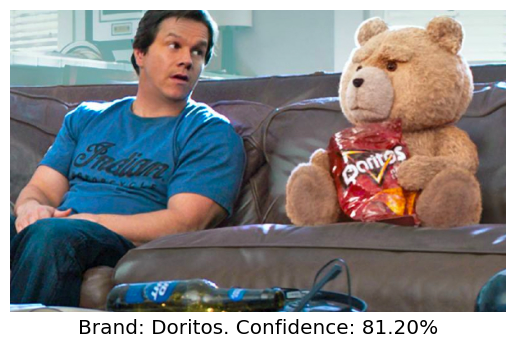

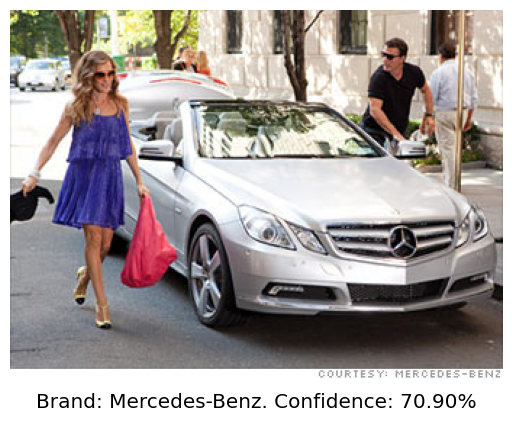

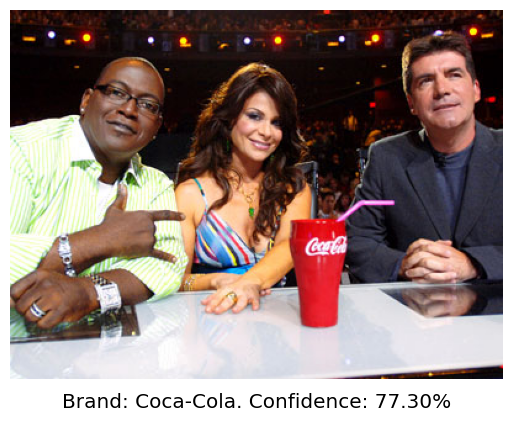

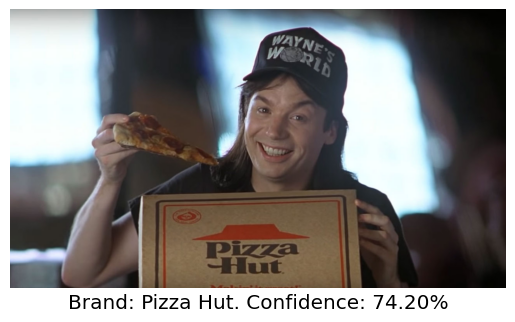

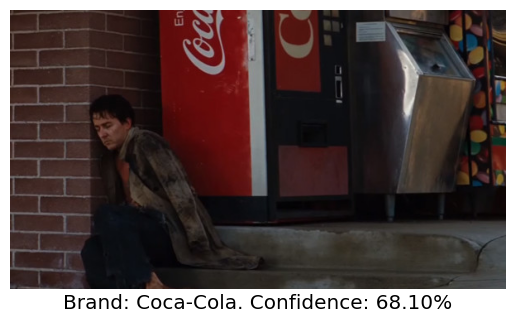

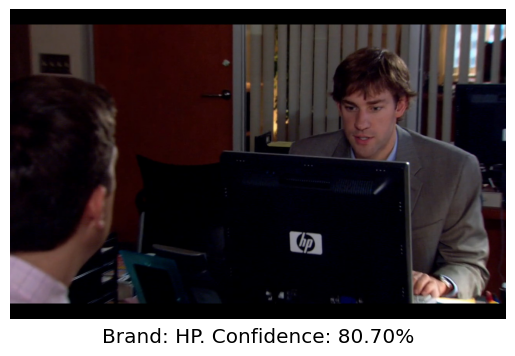

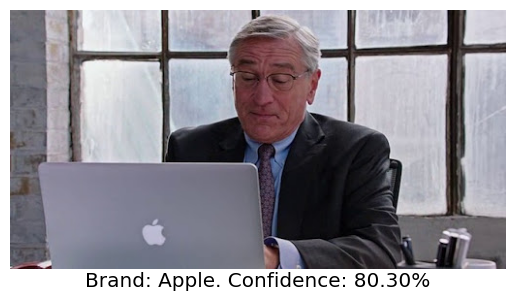


Processing complete!

Number of images that contain at least one product brand or corporate logo: 8
Brand name: "McDonald's", Times seen: 1
Brand name: "Doritos", Times seen: 1
Brand name: "Mercedes-Benz", Times seen: 1
Brand name: "Coca-Cola", Times seen: 2
Brand name: "Pizza Hut", Times seen: 1
Brand name: "HP", Times seen: 1
Brand name: "Apple", Times seen: 1


In [39]:
import os
import pandas as pd
import time
import matplotlib.pyplot as plt
from PIL import Image
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from msrest.authentication import CognitiveServicesCredentials

# Set up the Computer Vision Client with your subscription key and endpoint
subscription_key = '718564642a784520a625a6b7f9d2884f'
endpoint = 'https://computer-vision-master.cognitiveservices.azure.com/'
client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

def analyze_image(image_filename, feature_name, analyze_by_domain=False):
    with open(image_filename, 'rb') as image:
        if analyze_by_domain:
            results = client.analyze_image_by_domain_in_stream(feature_name, image)
        else:
            results = client.analyze_image_in_stream(image, visual_features=[feature_name])
    time.sleep(3.1)  # Ensure we do not exceed the rate limit
    return results

def display_image(image_filename, image_caption=None):
    image = Image.open(image_filename)
    plt.imshow(image)
    plt.axis('off')
    if image_caption is not None:  # If we need to display a caption for this image
        plt.title(image_caption, size='x-large', y=-0.1)
    plt.show()

# Define a variable to hold the number of images that contain at least one product brand or corporate logo
brand_count = 0

# A dictionary containing the names of brands identified in the images (keys)
# and the number of times the brand was identified (values)
brands = {}

# Update status
print('Processing images (this should take about 90 seconds)...')

# Directory containing the images
image_directory = '/bin/images'

# Create a DataFrame with image filenames
df = pd.DataFrame({
    'image_filename': [os.path.join(image_directory, f) for f in os.listdir(image_directory) if f.endswith('.jpg')]
})

# For each image
for index, row in df.iterrows():
    image_filename = row['image_filename']

    # Send the image to the API and request that it be analyzed for brands
    results = analyze_image(image_filename, 'brands')

    # If at least one brand was identified in the current image
    if len(results.brands) > 0:
        # Increment the number of images that contain a product brand or corporate logo
        brand_count += 1

        # For each brand identified in this image
        for brand in results.brands:
            # If the name of this brand already exists in the 'brands' dictionary
            if brand.name in brands:
                brands[brand.name] += 1  # Increment the number of times that we've seen this brand
            else:  # If this brand does not already exist in the 'brands' dictionary
                brands[brand.name] = 1  # Add this brand to the dictionary and set its observation count to 1

            # Display the image and the name of the detected brand
            display_image(image_filename, image_caption='Brand: {}. Confidence: {:.2f}%'.format(brand.name, brand.confidence * 100))

# Update status
print('\nProcessing complete!\n')

# Print the number of images that contain at least one brand
print('Number of images that contain at least one product brand or corporate logo: {}'.format(brand_count))

# Print the name of each brand that was identified, along with the total number of times that each brand was seen
for brand_name in brands:
    print('Brand name: "{}", Times seen: {}'.format(brand_name, brands[brand_name]))


## Identifying Clipart and Line Drawings
Another interesting capability that the Computer Vision cognitive service provides is the ability to distinguish line drawings and clipart images from other kinds of images. Let's test this capability using our dataset.

#### Task for Questions 04 and 05:
The cell below contains code that will send all of the images in the dataset to the API in order to determine which images are *line drawings*. Modify this code so that it will also determine which images are *clipart*.

**NOTE**: It is possible for an image to be both a line drawing *and* clipart!

#### Question 04:
How many of the images in the dataset did the API identify as being line drawings?

#### Question 05:
How many of the images in the dataset did the API identify as being clipart?

Processing complete!

##### LINE DRAWINGS ######


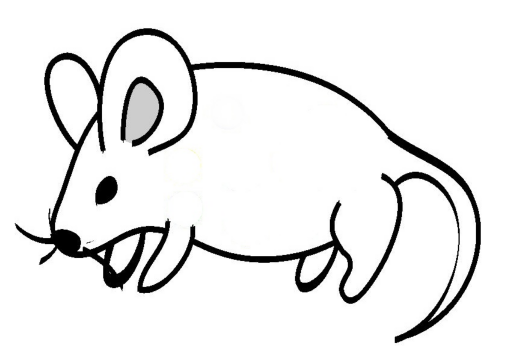

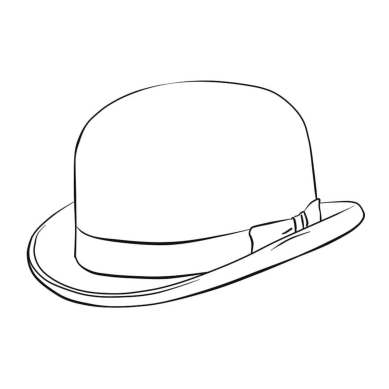


##### CLIPART IMAGES ######


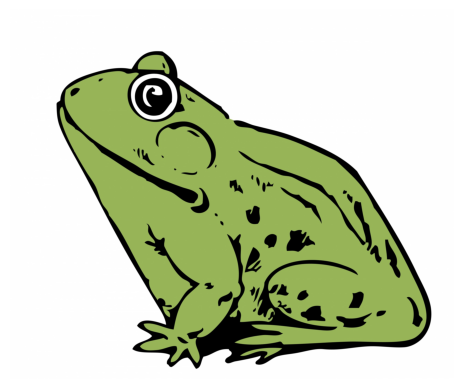

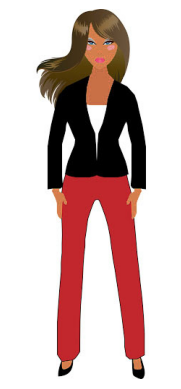

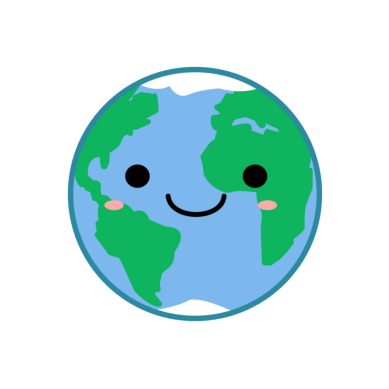

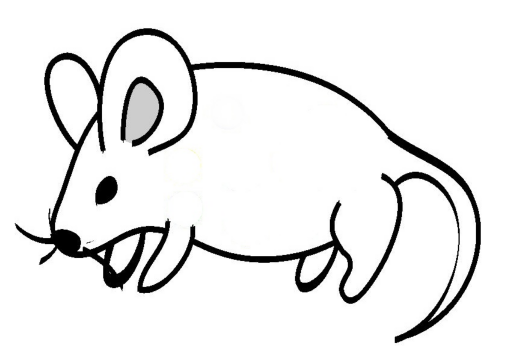

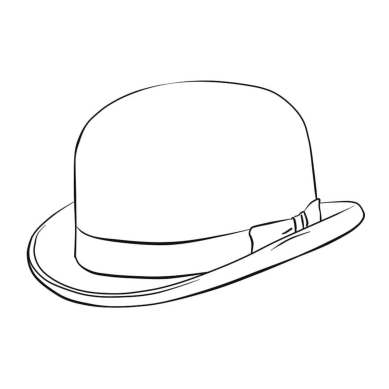

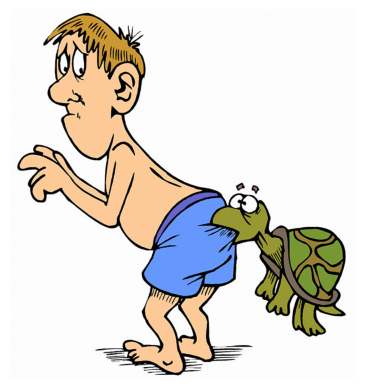

Number of images identified as line drawings: 2
Number of images identified as clipart: 6


In [53]:
import os

#define collections to hold the file names of images that are identified as line drawings and clipart
line_drawings = []
clipart_images = []

# Directory containing the images
image_directory = '/datalab/images'

# For each image
current_image = 0
for image_filename in os.listdir(image_directory):
    if image_filename.endswith('.jpg'):
        # Display overall progress
        clear_output(wait=True)
        current_image += 1
        print('Processing image {} of {}...'.format(current_image, total_images))

        # Send the image to the API and request that it be analyzed for image type
        results = analyze_image(os.path.join(image_directory, image_filename), 'ImageType')

        # If this image appears to be a line drawing
        if results.image_type.line_drawing_type > 0:
            # Add the file name of this line drawing image to the collection
            line_drawings.append(image_filename)

        # If this image appears to be clipart
        if results.image_type.clip_art_type > 0:
            # Add the file name of this clipart image to the collection
            clipart_images.append(image_filename)

# Update status
clear_output(wait=True)
print('Processing complete!')

# Display line drawing images
print('\n##### LINE DRAWINGS ######')
for image_filename in line_drawings:
    display_image(os.path.join(image_directory, image_filename))

# Display clipart images
print('\n##### CLIPART IMAGES ######')
for image_filename in clipart_images:
    display_image(os.path.join(image_directory, image_filename))

# Count the number of line drawings and clipart images
num_line_drawings = len(line_drawings)
num_clipart_images = len(clipart_images)

# Print the results
print("Number of images identified as line drawings:", num_line_drawings)
print("Number of images identified as clipart:", num_clipart_images)


## Identifying Celebrities and Landmarks
According to the *Oxford English Dictionary*, a **celebrity** is:
> "A famous or well-known person."

And a **landmark** is:
> "An object or feature of a landscape or town that is easily seen and recognized from a distance, especially one that enables someone to establish their location."

The Computer Vision API can identify both celebrities and landmarks in images. Let's test these capabilities using the images in our dataset.

#### Task for Questions 06 and 07:
The code cell immediately below demonstrates how to use the Computer Vision API to identify landmarks in images. Run the code cell to identify all of the landmarks that appear in the images in the dataset.

A similar approach can be used for identifying celebrities in images. In the second code cell below, write some Python code that will identify all of the celebrities that appear in the images in the dataset.

#### Question 06:
Which landmarks did the API identify among the images in the dataset?

#### Question 07:
Which celebrity appears most frequently in the images in the dataset?

Processing images (this should take about 90 seconds)...




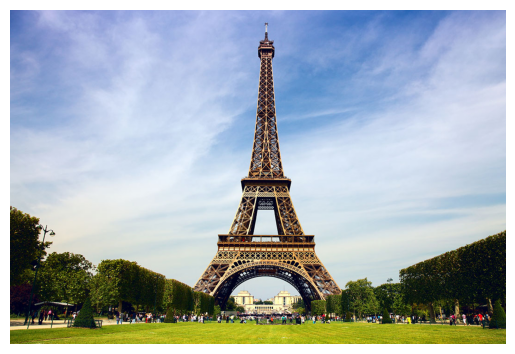

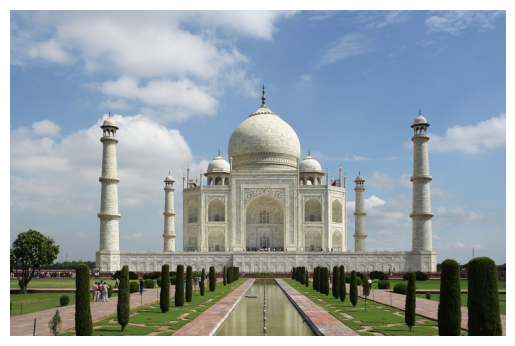

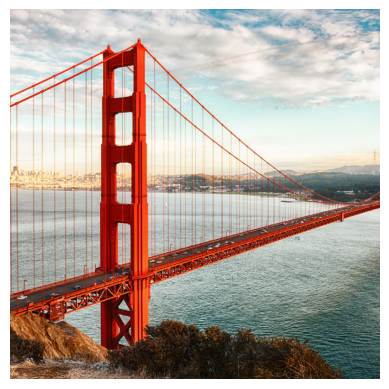


Processing complete!

Landmarks identified in the images:
Eiffel Tower
Taj Mahal
Golden Gate Bridge


In [44]:
##### Question 6: IDENTIFY LANDMARKS #####

# Update status
print('Processing images (this should take about 90 seconds)...')

# List to hold the landmarks identified in the images
landmarks = []

# Directory containing the images
image_directory = '/datalab/images'

# For each image
for image_filename in os.listdir(image_directory):
    if image_filename.endswith('.jpg'):
        # Send the image to the API and request that it be analyzed using the 'landmarks' domain
        results = analyze_image(os.path.join(image_directory, image_filename), 'landmarks', analyze_by_domain=True)

        # If at least one landmark was identified in this image
        if len(results.result['landmarks']) > 0:
            # Display the image containing the landmark(s)
            print('\n')  # Print an empty line
            display_image(os.path.join(image_directory, image_filename))
            # Print the name of each landmark that appears in the image
            for landmark in results.result['landmarks']:
                landmarks.append(landmark['name'])

# Update status
print('\nProcessing complete!\n')

# Print the list of landmarks identified in the images
print('Landmarks identified in the images:')
for landmark in landmarks:
    print(landmark)


In [52]:
from collections import Counter

# Count the occurrences of each celebrity
celebrity_counts = Counter(celebrities)

# Find the most frequent celebrity
most_common_celebrity = celebrity_counts.most_common(1)[0]

print("The celebrity who appears most frequently in the images is:", most_common_celebrity[0])
print("Number of occurrences:", most_common_celebrity[1])


The celebrity who appears most frequently in the images is: Mark Wahlberg
Number of occurrences: 2


## Detecting the Age and Gender of People in Images
The Computer Vision API has many abilities related to human faces. Two of the more interesting things that the API can do in this area is estimate the age and gender of the people in an image based on the appearance of their faces.

#### Task for Questions 08, 09, and 10:
The code cell below demonstrates how to use the Computer Vision API to get an estimate of the age and gender of a person appearing in an image.

For your final task in this lab assignment, write some Python code that will use the API to get estimates of the ages and genders of all of the people who appear in the images in the dataset. Specifically, you will need to:
* Display each image in which at least one face is detected on the screen, along with the ages and genders of the people appearing in that image. This will allow you to answer Question 08 below.
* Keep a record of the age and gender of each person that the API identifies. This will provide you with the raw data that you'll need to answer Questions 09 and 10 below.

#### Question 08:
How old (in years) is the woman portrayed in Leonardo da Vinci's painting *Mona Lisa* (also known as *La Gioconda*), according to the Computer Vision API?

#### Question 09:
Among all of the people who appear in the images in the dataset, how many people did the API classify as female?

#### Question 10:
According to the Computer Vision API, what is the average age among all of the people who appear in the images in the dataset? Please provide your answer using two decimals of precision (e.g., 42.33).

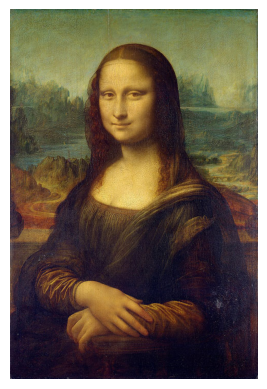

30-year-old Female
--------------------------------------------------


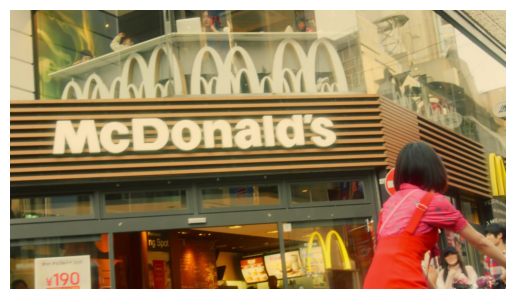

25-year-old Female
--------------------------------------------------


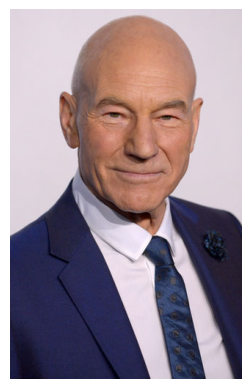

62-year-old Male
--------------------------------------------------


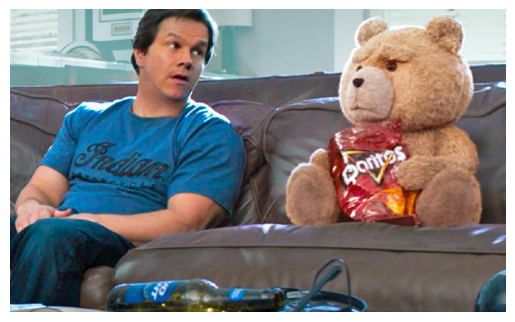

38-year-old Male
--------------------------------------------------


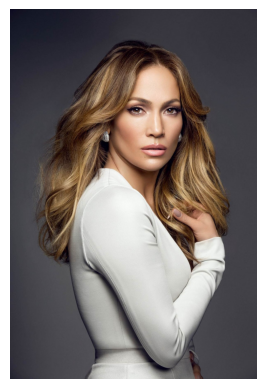

28-year-old Female
--------------------------------------------------


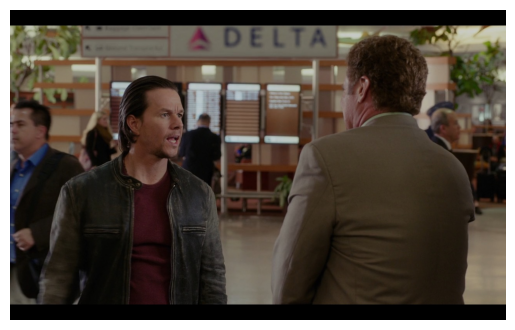

38-year-old Male
--------------------------------------------------


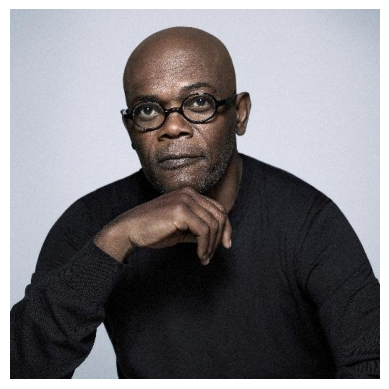

47-year-old Male
--------------------------------------------------


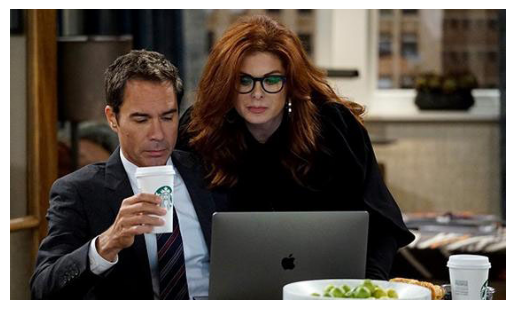

47-year-old Male
31-year-old Female
--------------------------------------------------


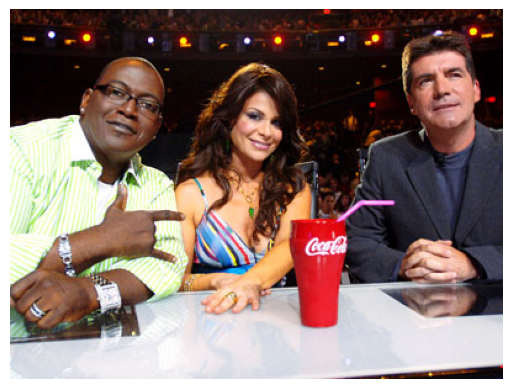

48-year-old Male
53-year-old Male
41-year-old Female
--------------------------------------------------


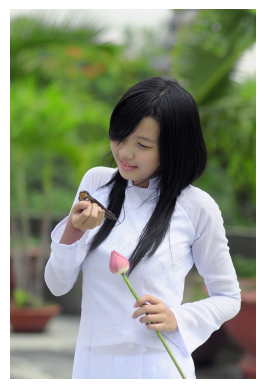

7-year-old Female
--------------------------------------------------


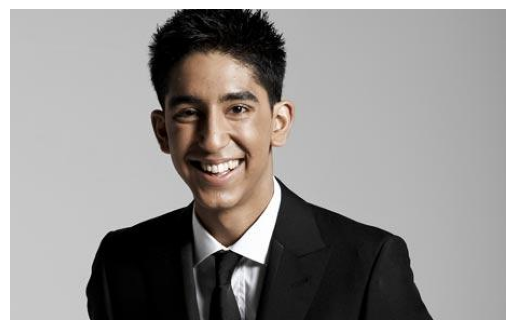

29-year-old Male
--------------------------------------------------


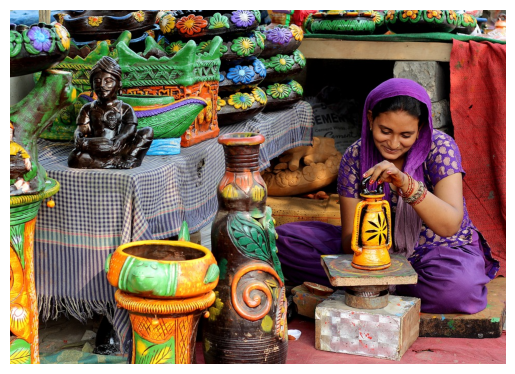

27-year-old Female
--------------------------------------------------


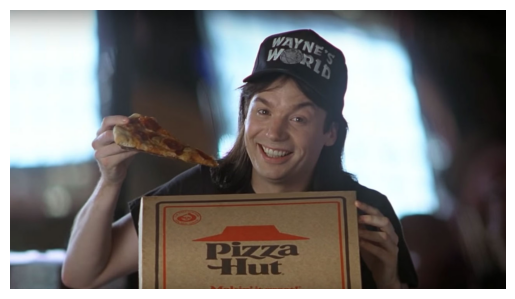

32-year-old Male
--------------------------------------------------


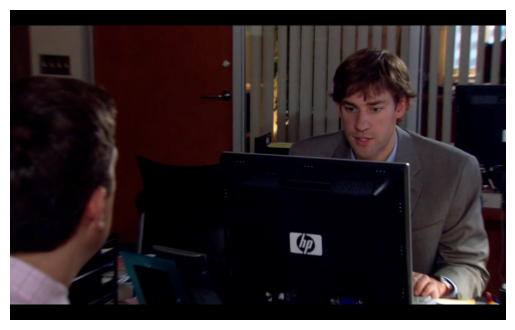

27-year-old Male
--------------------------------------------------


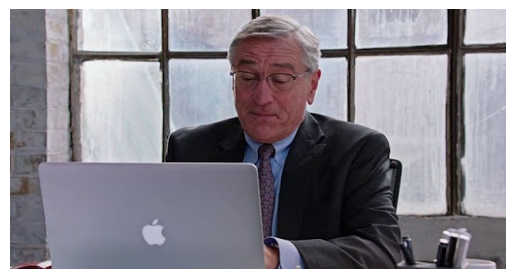

67-year-old Male
--------------------------------------------------
Analysis of images complete.


In [63]:
# Define the directory containing the images
image_directory = '/datalab/images'

# Dictionary to hold the age and gender of each person detected
age_gender_records = {}

# Iterate over each image in the directory
for image_filename in os.listdir(image_directory):
    if image_filename.endswith('.jpg'):
        # Call the Computer Vision API to analyze faces in the image
        results = analyze_image(os.path.join(image_directory, image_filename), 'faces')

        # Check if faces were detected in the image
        if len(results.faces) > 0:
            # Display the image with detected faces along with their ages and genders
            display_image(os.path.join(image_directory, image_filename))

            # Loop through each detected face
            for i, face in enumerate(results.faces):
                # Print the age and gender of the detected face
                print('{}-year-old {}'.format(face.age, face.gender))

                # Add the age and gender to the records dictionary
                age_gender_records[(image_filename, i)] = (face.age, face.gender)

            # Add a separator after each image
            print('-' * 50)

# Print completion message
print("Analysis of images complete.")


In [66]:
# Count the number of people classified as female
female_count = sum(1 for _, (_, gender) in age_gender_records.items() if gender == 'Female')

# Print the result
print("Number of people classified as female:", female_count)


Number of people classified as female: 7


Processing images (this may take some time depending on the number of images and faces detected)...


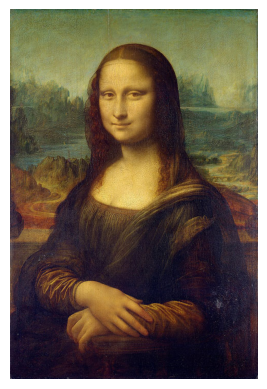

30-year-old Female
------------------------------


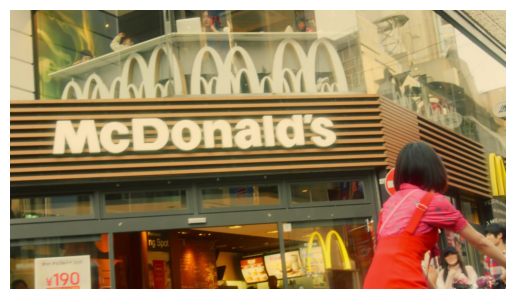

25-year-old Female
------------------------------


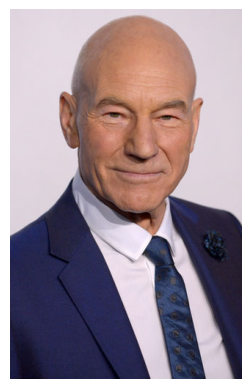

62-year-old Male
------------------------------


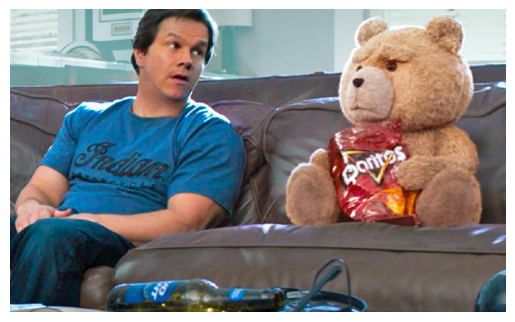

38-year-old Male
------------------------------


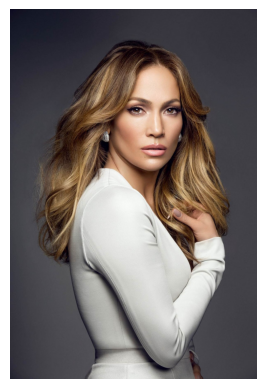

28-year-old Female
------------------------------


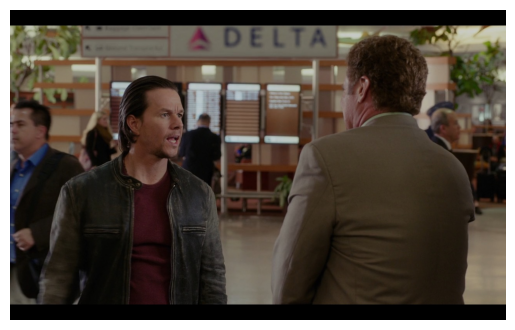

38-year-old Male
------------------------------


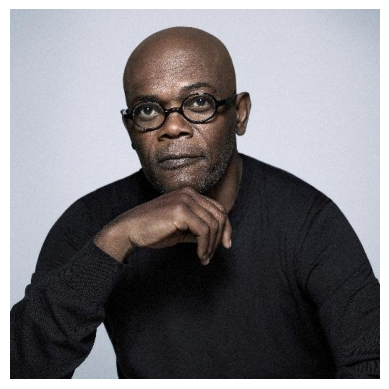

47-year-old Male
------------------------------


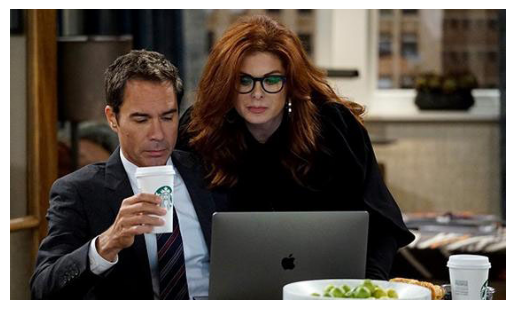

47-year-old Male
31-year-old Female
------------------------------


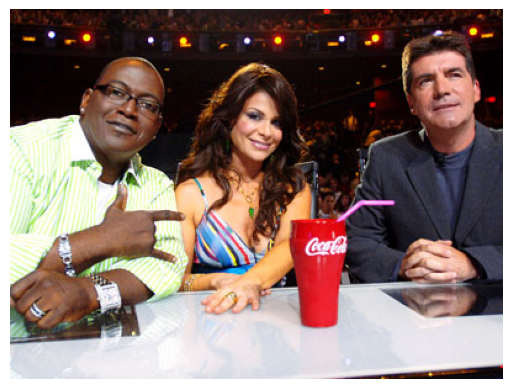

48-year-old Male
53-year-old Male
41-year-old Female
------------------------------


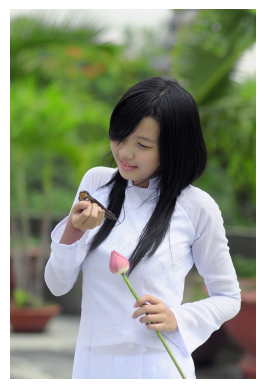

7-year-old Female
------------------------------


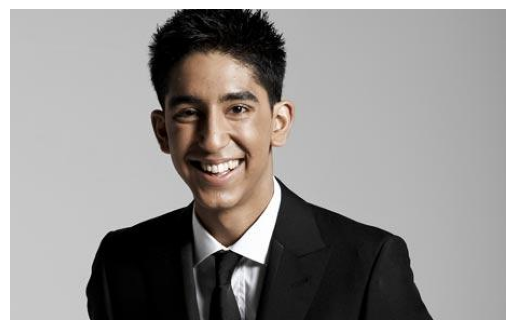

29-year-old Male
------------------------------


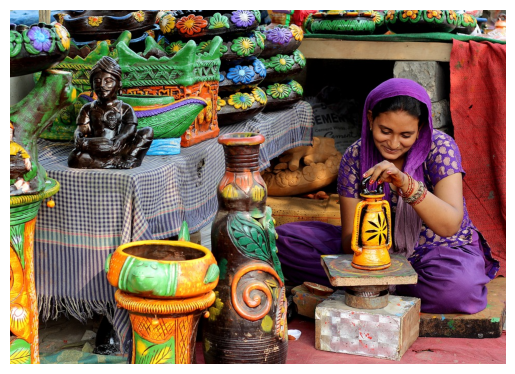

27-year-old Female
------------------------------


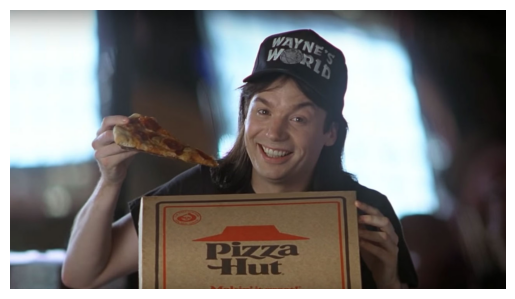

32-year-old Male
------------------------------


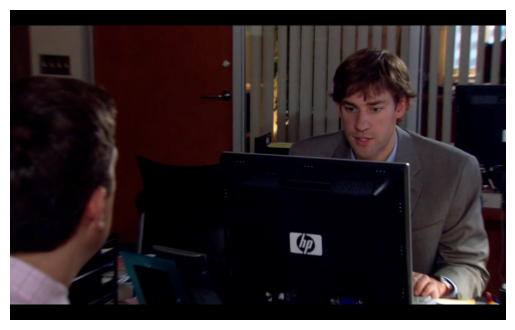

27-year-old Male
------------------------------


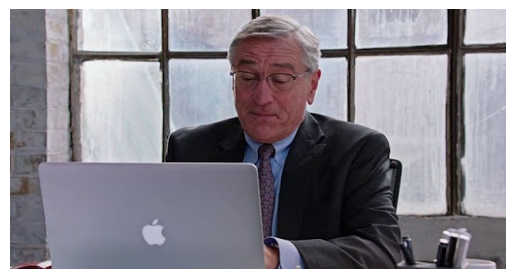

67-year-old Male
------------------------------

Processing complete!

Raw data of age and gender records:
Image: SITU.jpg, Face Index: 0, Age: 30 years old, Gender: Female
Image: GJQW.jpg, Face Index: 0, Age: 25 years old, Gender: Female
Image: WKXJ.jpg, Face Index: 0, Age: 62 years old, Gender: Male
Image: WRVP.jpg, Face Index: 0, Age: 38 years old, Gender: Male
Image: JMRY.jpg, Face Index: 0, Age: 28 years old, Gender: Female
Image: QNEA.jpg, Face Index: 0, Age: 38 years old, Gender: Male
Image: QVQJ.jpg, Face Index: 0, Age: 47 years old, Gender: Male
Image: XISS.jpg, Face Index: 0, Age: 47 years old, Gender: Male
Image: XISS.jpg, Face Index: 1, Age: 31 years old, Gender: Female
Image: OTPA.jpg, Face Index: 0, Age: 48 years old, Gender: Male
Image: OTPA.jpg, Face Index: 1, Age: 53 years old, Gender: Male
Image: OTPA.jpg, Face Index: 2, Age: 41 years old, Gender: Female
Image: BAIX.jpg, Face Index: 0, Age: 7 years old, Gender: Female
Image: JLPA.jpg, Face Index: 0, Age: 29 years old,

In [50]:
# Define a dictionary to hold the age and gender of each person identified
age_gender_records = {}

# Update status
print('Processing images (this may take some time depending on the number of images and faces detected)...')

# Directory containing the images
image_directory = '/datalab/images'

# For each image
for image_filename in os.listdir(image_directory):
    if image_filename.endswith('.jpg'):
        # Call the Computer Vision API to analyze faces and get age and gender estimates
        results = analyze_image(os.path.join(image_directory, image_filename), 'faces')

        # If faces were detected in the image
        if len(results.faces) > 0:
            # Display the image
            display_image(os.path.join(image_directory, image_filename))

            # Initialize a list to hold the age and gender of each person in this image
            age_gender_list = []

            # Loop through each detected face
            for idx, face in enumerate(results.faces):
                # Print the age and gender of the detected face
                print('{}-year-old {}'.format(face.age, face.gender))

                # Add the age and gender to the records dictionary
                age_gender_records[(image_filename, idx)] = (face.age, face.gender)

            # Add a separator after each image
            print('-' * 30)

# Update status
print('\nProcessing complete!\n')

# Print the raw data of age and gender records
print('Raw data of age and gender records:')
for key, value in age_gender_records.items():
    print('Image: {}, Face Index: {}, Age: {} years old, Gender: {}'.format(key[0], key[1], value[0], value[1]))


In [65]:
# Calculate the total age and count of people
total_age = sum(age for _, (age, _) in age_gender_records.items())
total_people = len(age_gender_records)

# Calculate the average age
if total_people > 0:
    average_age = total_age / total_people
else:
    average_age = 0

# Print the average age with two decimal places of precision
print("Average age among all people:", "{:.2f}".format(average_age))


Average age among all people: 37.61


## End of Lab Assignment 04!